In [2]:
import numpy as np
import pandas as pd
from scipy import stats
import seaborn as sns
import matplotlib.pylab as plt
import warnings
warnings.filterwarnings('ignore')

In [3]:
data = pd.read_csv('D:/research work/FailureMode_shear wall/input.csv')
print('Shape of the data is ', data.shape)

Shape of the data is  (181, 11)


In [4]:
data.head()

,r,fck,n,fy,As,fyw,ρw,fsw,ρsw,Vf/Vs,Failure mode
0,2.21,24.0,0.04,480.0,180.0,480.0,1.17,510.0,0.64,0.33,F
1,2.21,34.7,0.03,480.0,180.0,480.0,2.80,510.0,1.28,0.31,FS
2,2.50,16.9,0.21,469.2,314.0,445.6,0.72,608.9,0.44,0.48,F
3,2.50,16.9,0.34,469.2,314.0,445.6,0.72,608.9,0.44,0.47,F
4,2.50,16.9,0.48,469.2,314.0,445.6,0.72,608.9,0.44,0.41,F


In [4]:
data.dtypes

r               float64
fck             float64
n               float64
fy              float64
As              float64
fyw             float64
ρw              float64
fsw             float64
ρsw             float64
Vf/Vs           float64
Failure mode     object
dtype: object

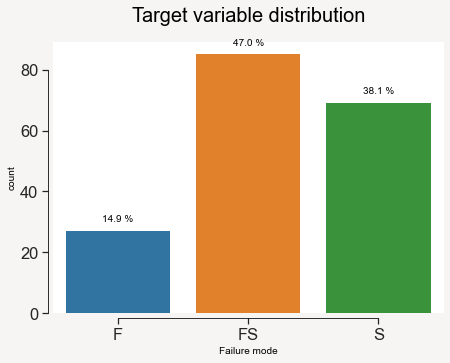

In [5]:
mypal= ['#FC05FB', '#FEAEFE', '#FCD2FC','#F3FEFA', '#B4FFE4','#3FFEBA', '#FC05FB', '#FEAEFE', '#FCD2FC']

plt.figure(figsize=(7, 5),facecolor='#F6F5F4')
total = float(len(data))
# ax = sns.countplot(x=data['Failure'], palette=mypal[1::1])
ax = sns.countplot(x=data['Failure mode'])
# ax.set_facecolor('#F6F5F4')

for p in ax.patches:
    
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,height + 3,'{:1.1f} %'.format((height/total)*100), ha="center")

ax.set_title('Target variable distribution', fontsize=20, y=1.05)
sns.set(font_scale=1.5)
# plt.rc('font',family='Times New Roman',size=12)
sns.despine(right=True)
sns.despine(offset=5, trim=True)


In [ ]:
data.head(0)

# Distribution of design and parameters

In [5]:
nf = ['r', 'fck', 'n', 'fy', 'As', 'fyw', 'ρw', 'fsw', 'ρsw', 'Vf/Vs',  'Failure mode']
data_ = data[nf]
# sns.set(font_scale=1.5)
#  plt.rc('font',family='Times New Roman',size=12)
# plt.rcParams['figure.dpi'] = 1200
# sns.set(style='whitegrid', rc={"grid.linewidth": 1},font='Times New Roman',font_scale=2)
# sns.pairplot(data,hue="Failure mode", diag_kind="hist",markers=["o", "s", "D"],palette="husl")
# plt.show()

In [6]:
num_feats = ['r', 'fck', 'n', 'fy', 'As', 'fyw', 'ρw', 'fsw', 'ρsw', 'Vf/Vs',  'Failure mode']

In [8]:
df_ = data[num_feats]
# corr = df_.corr(method='pearson')
# mask = np.triu(np.ones_like(corr, dtype=bool))
# #f, ax = plt.subplots(figsize=(8, 5), facecolor=None)
# sns.set(font_scale=1.5)
# plt.rc('font',family='Times New Roman',size=12)
# plt.rcParams['figure.dpi'] = 600
# f, ax = plt.subplots(figsize=(10, 6),facecolor=None)
# cmap = sns.color_palette(mypal, as_cmap=True)
# sns.heatmap(corr, mask=mask, cmap="YlGnBu", vmax=1.0, vmin=-1.0, center=0, annot=True,
#             square=False, linewidths=1, cbar_kws={"shrink": 1})
# ax.set_title("Numerical features correlation (Pearson's)", font='Times New Roman',fontsize=20, y= 1.05);
# #plt.savefig('pic.png', dpi=300)

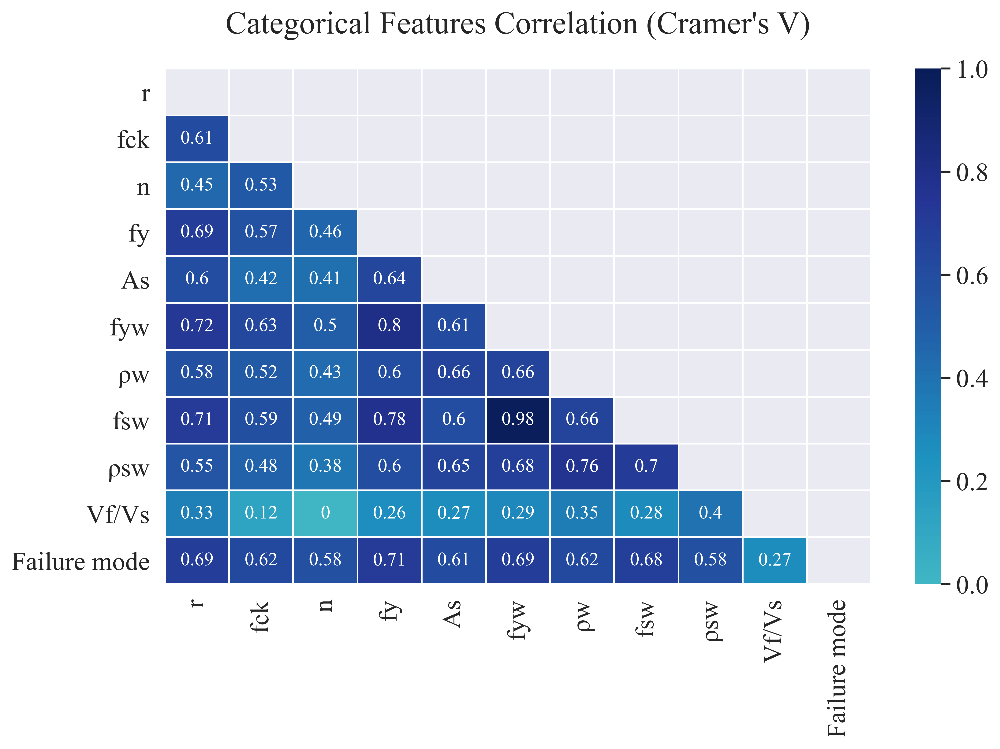

In [9]:
# the cramers_v function is copied from https://towardsdatascience.com/the-search-for-categorical-correlation-a1cf7f1888c9

def cramers_v(x, y): 
    confusion_matrix = pd.crosstab(x,y)
    chi2 = stats.chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2/n
    r,k = confusion_matrix.shape
    phi2corr = max(0, phi2-((k-1)*(r-1))/(n-1))
    rcorr = r-((r-1)**2)/(n-1)
    kcorr = k-((k-1)**2)/(n-1)
    return np.sqrt(phi2corr/min((kcorr-1),(rcorr-1)))

# calculate the correlation coefficients using the above function
data_ = data[num_feats]
rows= []
for x in data_:
    col = []
    for y in data_ :
        cramers =cramers_v(data_[x], data_[y]) 
        col.append(round(cramers,2))
    rows.append(col)
    
cramers_results = np.array(rows)
df = pd.DataFrame(cramers_results, columns = data_.columns, index = data_.columns)

# color palette 
mypal_1= ['#FC05FB', '#FEAEFE', '#FCD2FC','#F3FEFA', '#B4FFE4','#3FFEBA', '#FC05FB', '#FEAEFE', '#FCD2FC']
# plot the heat map
mask = np.triu(np.ones_like(df, dtype=bool))
corr = df.mask(mask)
f, ax = plt.subplots(figsize=(10, 6), facecolor=None)
cmap = sns.color_palette(mypal_1, as_cmap=True)
sns.set(font_scale=1.5)
plt.rc('font',family='Times New Roman',size=12)
sns.heatmap(corr, mask=mask, cmap="YlGnBu", vmax=1.0, vmin=0, center=0, annot=True,
            square=False, linewidths=1, cbar_kws={"shrink": 1})
ax.set_title("Categorical Features Correlation (Cramer's V)", fontsize=20, y= 1.05);

In [ ]:
# pip install shap

In [ ]:
# pip install --upgrade shap

In [10]:
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC, NuSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis

from sklearn.metrics import confusion_matrix, plot_confusion_matrix, classification_report
from sklearn.metrics import recall_score, accuracy_score,roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier

from sklearn.preprocessing import LabelEncoder
import shap 

In [6]:
X = data.loc[:, data.columns != 'Failure mode']
y=data['Failure mode']
X.head()
#y.head()

,r,fck,n,fy,As,fyw,ρw,fsw,ρsw,Vf/Vs
0,2.21,24.0,0.04,480.0,180.0,480.0,1.17,510.0,0.64,0.33
1,2.21,34.7,0.03,480.0,180.0,480.0,2.80,510.0,1.28,0.31
2,2.50,16.9,0.21,469.2,314.0,445.6,0.72,608.9,0.44,0.48
3,2.50,16.9,0.34,469.2,314.0,445.6,0.72,608.9,0.44,0.47
4,2.50,16.9,0.48,469.2,314.0,445.6,0.72,608.9,0.44,0.41


### Spliting the data into training and test sets

In [7]:
# y.head()
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [47]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC, NuSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis

from matplotlib import pyplot as plt

### Multi-plot confusion matrix

In [52]:
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from matplotlib import pyplot as plt
from sklearn.datasets import load_iris
from sklearn.metrics import plot_confusion_matrix

# data = load_iris()
# X = data.data
# y = data.target

In [53]:
from sklearn.model_selection import train_test_split

# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)
classifiers = [GaussianNB(), 
               KNeighborsClassifier(n_neighbors=5),
               LogisticRegression(solver="liblinear", random_state=0),
               SVC(probability=True, random_state=0),
               DecisionTreeClassifier(random_state=0),
               RandomForestClassifier(random_state=0),
               AdaBoostClassifier(n_estimators=100, random_state=0),
               GradientBoostingClassifier(random_state=0),
               MLPClassifier(random_state=0)]

for cls in classifiers:
    cls.fit(X_train, y_train)

confusion matrix of training

In [59]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15,12))
plt.rcParams['figure.dpi'] =1200
for cls, ax in zip(classifiers, axes.flatten()):
    plot_confusion_matrix(cls, 
                          X_train, 
                          y_train, 
                          ax=ax, 
                          cmap='Blues',
                        display_labels=['F','FS','FS'])
    ax.title.set_text(type(cls).__name__)
plt.tight_layout()  
plt.show()
# plt.savefig('shap.png', dpi=1200)

confusion matrix of test

In [60]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15,12))
plt.rcParams['figure.dpi'] =1200
for cls, ax in zip(classifiers, axes.flatten()):
    plot_confusion_matrix(cls, 
                          X_test, 
                          y_test, 
                          ax=ax, 
                          cmap='Blues',
                        display_labels=['F','FS','S'])
    ax.title.set_text(type(cls).__name__)
plt.tight_layout()  
plt.show()
# plt.savefig('test_raw.png', dpi=1200)

# 1 Naive Bayes 

In [18]:
from sklearn.naive_bayes import GaussianNB

gnb = GaussianNB()
gnb.fit(X_train, y_train)
print('Accuracy of GNB classifier on training set: {:.2f}'
     .format(gnb.score(X_train, y_train)))
print('Accuracy of GNB classifier on test set: {:.2f}'
     .format(gnb.score(X_test, y_test)))

Accuracy of GNB classifier on training set: 0.74
Accuracy of GNB classifier on test set: 0.82


In [22]:
from sklearn.metrics import plot_confusion_matrix
# plot_confusion_matrix(gnb, X_train, y_train, cmap='YlGnBu')  

### Confusion Matrix of training set

In [23]:
y_pred_train = gnb.predict(X_train)
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_train, y_pred_train)
print(confusion_matrix)

[[17  1  0]
 [23 33  6]
 [ 0  3 43]]


In [24]:
from sklearn.metrics import classification_report
print(classification_report(y_train, y_pred_train))

              precision    recall  f1-score   support

           F       0.42      0.94      0.59        18
          FS       0.89      0.53      0.67        62
           S       0.88      0.93      0.91        46

    accuracy                           0.74       126
   macro avg       0.73      0.80      0.72       126
weighted avg       0.82      0.74      0.74       126



### Confusion Matrix of test set

In [25]:
y_pred = gnb.predict(X_test)
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test, y_pred)
print(confusion_matrix)

[[ 8  1  0]
 [ 5 16  2]
 [ 0  2 21]]


In [26]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           F       0.62      0.89      0.73         9
          FS       0.84      0.70      0.76        23
           S       0.91      0.91      0.91        23

    accuracy                           0.82        55
   macro avg       0.79      0.83      0.80        55
weighted avg       0.83      0.82      0.82        55



# 2 K-Nearest neighbors

In [27]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)
print('Accuracy of K-NN classifier on training set: {:.2f}'
     .format(knn.score(X_train, y_train)))
print('Accuracy of K-NN classifier on test set: {:.2f}'
     .format(knn.score(X_test, y_test)))

Accuracy of K-NN classifier on training set: 0.78
Accuracy of K-NN classifier on test set: 0.71


# 3 Logistic Regression

In [28]:
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression(solver="liblinear", random_state=0)
lr.fit(X_train, y_train)
print('Accuracy of lr classifier on training set: {:.2f}'
     .format(lr.score(X_train, y_train)))
print('Accuracy of lr classifier on test set: {:.2f}'
     .format(lr.score(X_test, y_test)))

Accuracy of lr classifier on training set: 0.82
Accuracy of lr classifier on test set: 0.84


# 4 Support Vectors

In [29]:
from sklearn.linear_model import LogisticRegression

svc=SVC(probability=True, random_state=0)
svc.fit(X_train, y_train)
print('Accuracy  on training set: {:.2f}'
     .format(lr.score(X_train, y_train)))
print('Accuracy on test set: {:.2f}'
     .format(lr.score(X_test, y_test)))

Accuracy  on training set: 0.82
Accuracy on test set: 0.84


# 5 Decision Tree

In [30]:
from sklearn.linear_model import LogisticRegression

dt=DecisionTreeClassifier(random_state=0)
dt.fit(X_train, y_train)
print('Accuracy  on training set: {:.2f}'
     .format(lr.score(X_train, y_train)))
print('Accuracy on test set: {:.2f}'
     .format(lr.score(X_test, y_test)))

Accuracy  on training set: 0.82
Accuracy on test set: 0.84


# 6 Random Forest

In [50]:
from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier(random_state=0)
rf.fit(X_train, y_train)
print('Accuracy classifier on training set: {:.2f}'
     .format(rf.score(X_train, y_train)))
print('Accuracy classifier on test set: {:.2f}'
     .format(rf.score(X_test, y_test)))

Accuracy classifier on training set: 1.00
Accuracy classifier on test set: 0.87


# 7 AdaBoost

In [32]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.datasets import make_classification

ADB = AdaBoostClassifier(n_estimators=100, random_state=0)
ADB.fit(X_train, y_train)
print('Accuracy classifier on training set: {:.2f}'
     .format(ADB.score(X_train, y_train)))
print('Accuracy classifier on test set: {:.2f}'
     .format(ADB.score(X_test, y_test)))

Accuracy classifier on training set: 0.74
Accuracy classifier on test set: 0.73


# 8 Gradient Boosting

In [33]:
gb=GradientBoostingClassifier(random_state=0)
gb.fit(X_train, y_train)
print('Accuracy classifier on training set: {:.2f}'
     .format(gb.score(X_train, y_train)))
print('Accuracy classifier on test set: {:.2f}'
     .format(gb.score(X_test, y_test)))

Accuracy classifier on training set: 0.99
Accuracy classifier on test set: 0.93


# 9 Neural Net

In [34]:
nn = MLPClassifier(random_state=0)
nn.fit(X_train, y_train)
print('Accuracy classifier on training set: {:.2f}'
     .format(nn.score(X_train, y_train)))
print('Accuracy classifier on test set: {:.2f}'
     .format(nn.score(X_test, y_test)))

Accuracy classifier on training set: 0.69
Accuracy classifier on test set: 0.71


From the models, random forest is the one having highest accuracy. Hence, feature importances analysis is conducted to this model.

### Model Explainablity

One of the challenges of a machine leaning project is explaining the model's prediction. A model might consider some features more important than other for its prediction. Another model might weigh other features as more important. **Permutation importance** and **SHAP** are two methods one can use to understand which features were selected to have the most impact on our model's prediction.

#### Permutation importance: 
The permutation importance is defined to be the **decrease in a model score** when a **single feature value** is *randomly shuffled*. The procedure breaks the relationship between the *feature* and the *target*, thus the drop in the **model score** is indicative of how much the model depends on the feature [[3](https://scikit-learn.org/stable/auto_examples/classification/plot_classifier_comparison.html)]. In other words, permutation importance tell us what features have the biggest impact on our model predictions. 

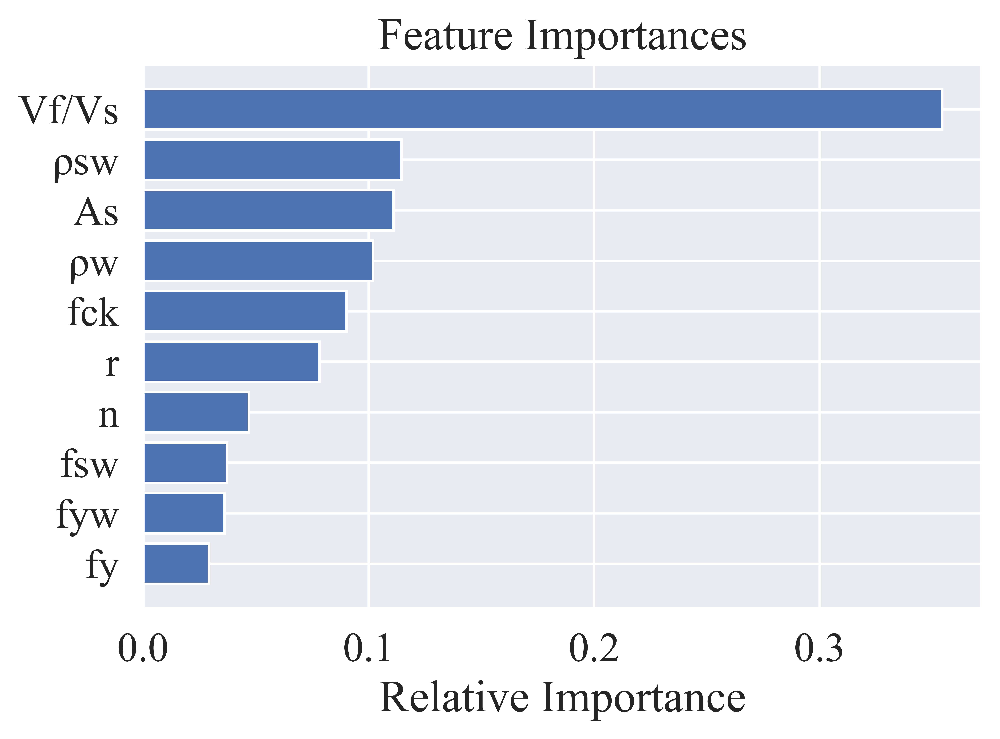

In [35]:
features = list(X.columns.values)

importances = rf.feature_importances_
import numpy as np
indices = np.argsort(importances)

plt.rc('font',family='Times New Roman',size=12)
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

In [ ]:
importances

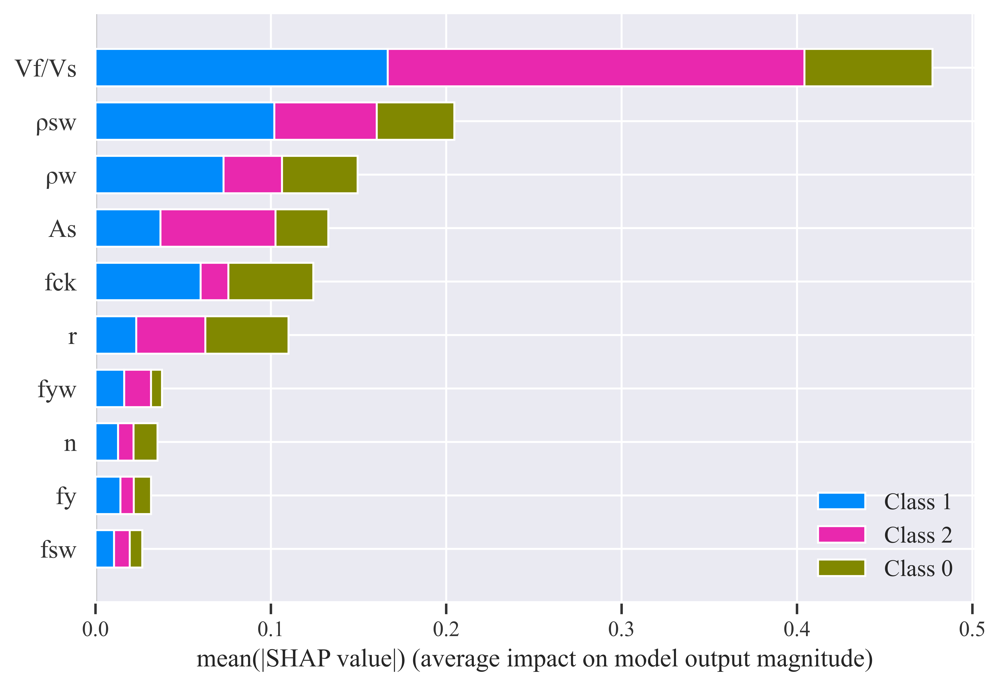

<Figure size 7200x4800 with 0 Axes>

In [36]:
import shap
shap.initjs()
explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test, feature_names=features, plot_type="bar")

plt.savefig('shap.png', dpi=1200)

# PCA as training input

In [8]:
from sklearn.decomposition import PCA
data_pca=PCA(n_components=10).fit_transform(data_.iloc[:,:10])

In [9]:
print(data_pca)

[[-9.90643083e+02 -1.04048758e+02 -2.25025238e+01 ...  2.60484759e-01
   2.65598821e-01 -1.05806034e-01]
 [-9.90622116e+02 -1.04207436e+02 -2.24516057e+01 ...  1.33872940e+00
   7.75124260e-01 -1.24058102e-01]
 [-8.55176918e+02 -1.33927687e+02 -6.41093010e+01 ...  2.98672879e-01
   7.03212470e-02  7.08177228e-02]
 ...
 [-8.54917290e+02 -3.53577385e+02  3.83435335e+01 ...  2.76361184e-01
  -9.72567826e-02 -1.44593036e-01]
 [-8.54917333e+02 -3.53577891e+02  3.83444155e+01 ...  6.02890935e-01
  -1.51015214e-01 -8.16654133e-02]
 [ 4.86333619e+01 -3.03276309e+02  2.88621928e+01 ...  1.23916239e+00
   5.04451007e-02 -1.30830073e-01]]


In [10]:
X_pca = data_pca
y_pca=data['Failure mode']
# X_pca.head()
#y.head()

In [11]:
# y.head()
from sklearn.model_selection import train_test_split

X_train_pca, X_test_pca, y_train_pca, y_test_pca = train_test_split(X_pca, y_pca, test_size=0.3, random_state=0)

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train_pca)
X_test = scaler.transform(X_test_pca)

In [12]:
from sklearn.ensemble import RandomForestClassifier
rf2_pca=RandomForestClassifier(random_state=0)
rf2_pca.fit(X_train_pca, y_train_pca)
print('Accuracy classifier on training set: {:.2f}'
     .format(rf2_pca.score(X_train_pca, y_train_pca)))
print('Accuracy classifier on test set: {:.2f}'
     .format(rf2_pca.score(X_test_pca, y_test_pca)))

Accuracy classifier on training set: 0.99
Accuracy classifier on test set: 0.95


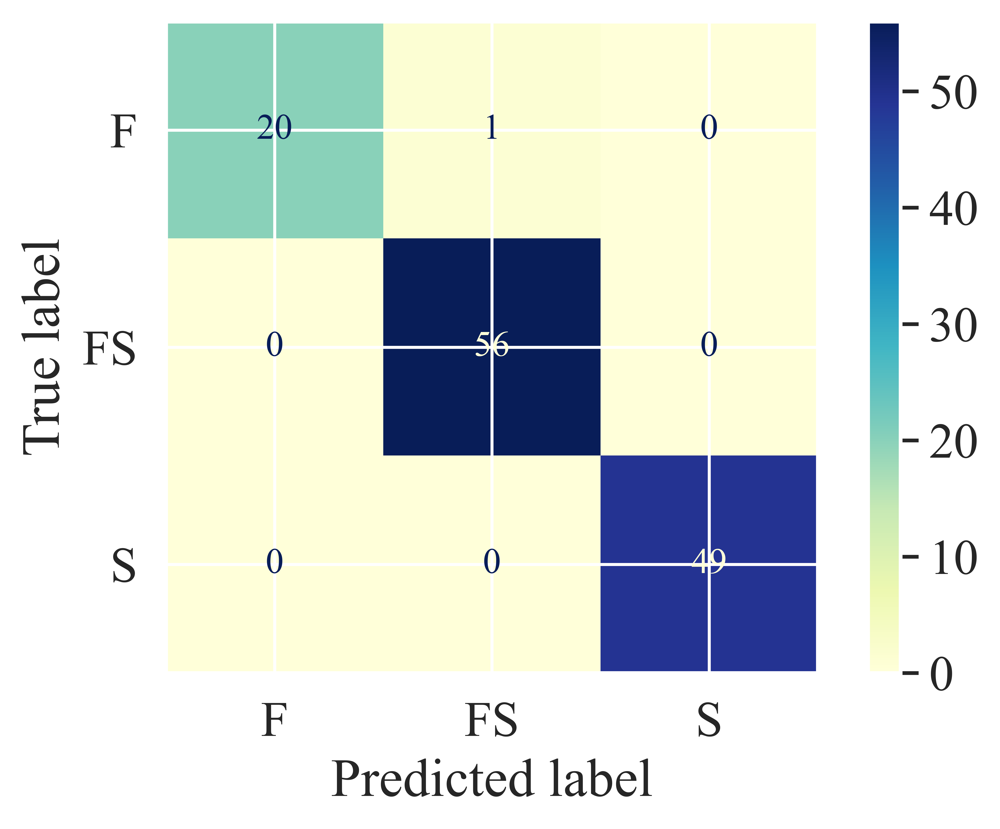

In [69]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(rf2_pca,X_train_pca, y_train_pca, cmap='YlGnBu')  

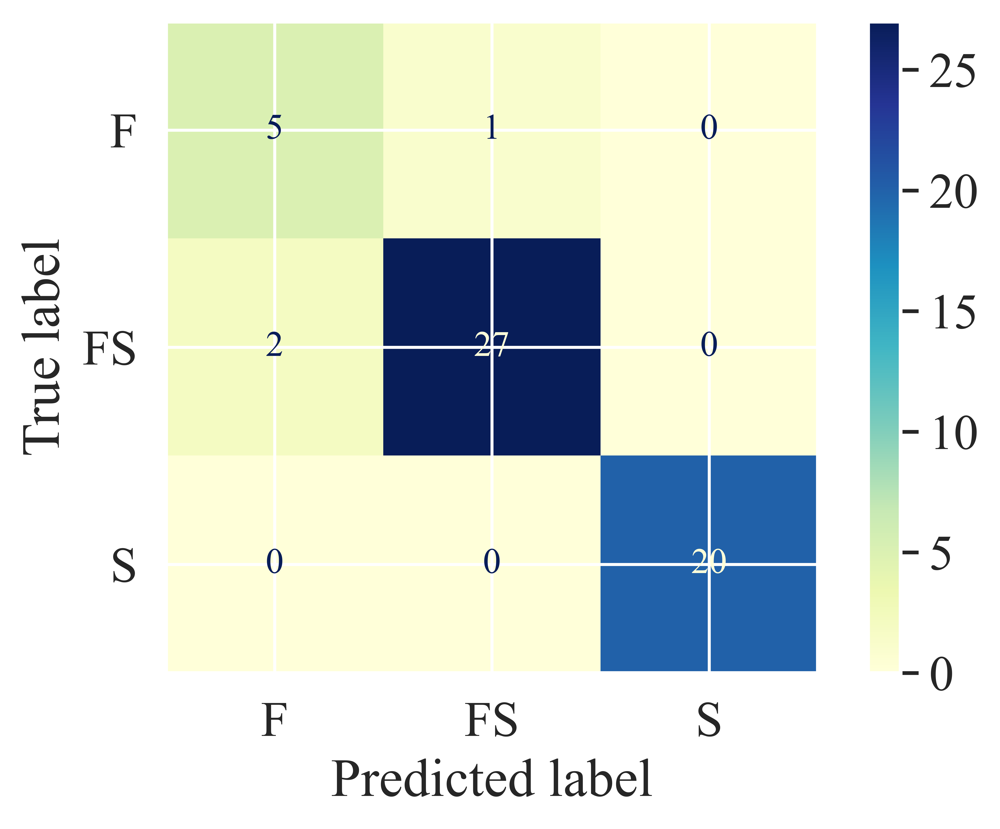

In [68]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(rf2_pca,X_test_pca, y_test_pca, cmap='YlGnBu')  

In [148]:
gb=GradientBoostingClassifier(random_state=0)
gb.fit(X_train_pca, y_train_pca)
print('Accuracy classifier on training set: {:.2f}'
     .format(gb.score(X_train_pca, y_train_pca)))
print('Accuracy classifier on test set: {:.2f}'
     .format(gb.score(X_test_pca, y_test_pca)))

Accuracy classifier on training set: 0.99
Accuracy classifier on test set: 0.93


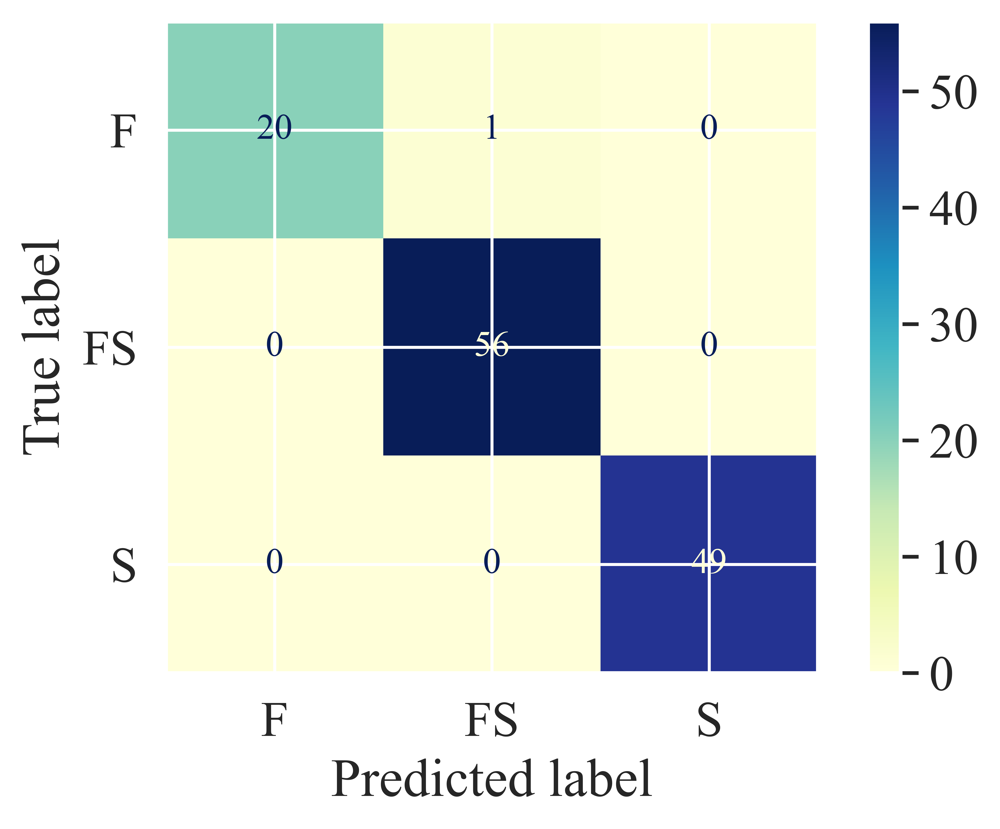

In [76]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(gb,X_train_pca, y_train_pca, cmap='YlGnBu')  

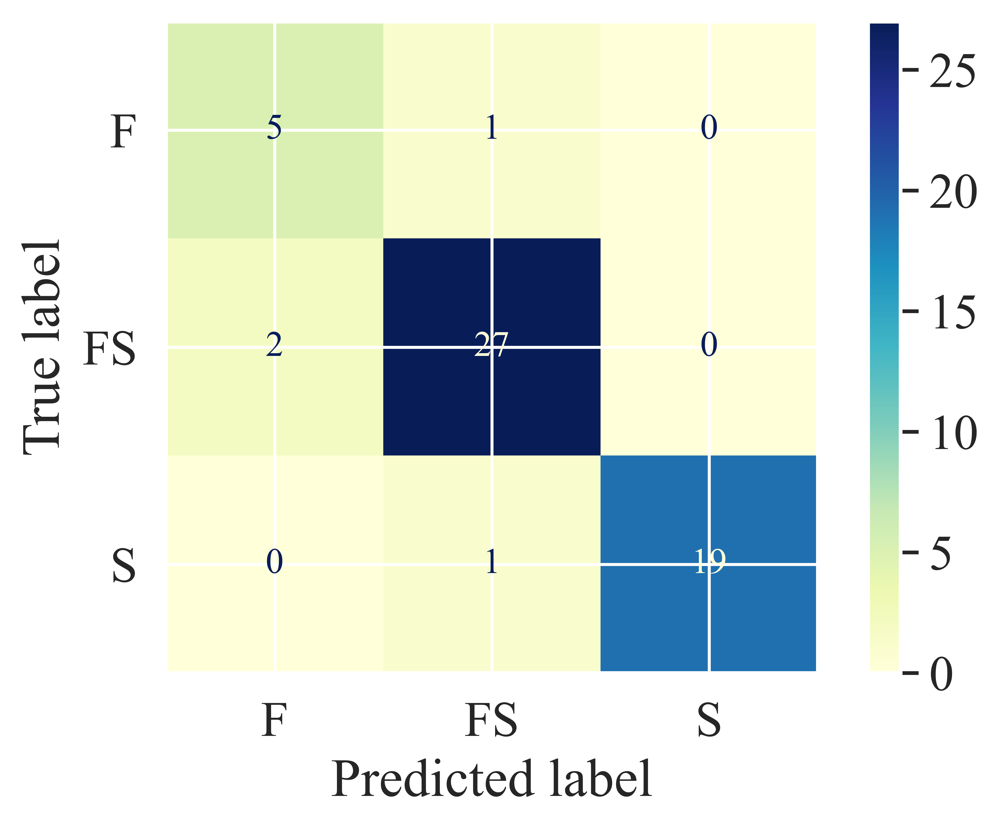

In [78]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(gb,X_test_pca, y_test_pca, cmap='YlGnBu')  

# Hyperparameter Optimization

In [16]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV
from sklearn import metrics


## gradient boosting optimization

In [17]:
params={
   'learning_rate':np.linspace(0.05,0.25,5), 
    'max_depth':[x for x in range(1,8,1)], 
    'min_samples_leaf':[x for x in range(1,5,1)], 
    'n_estimators':[x for x in range(50,100,10)]}

In [19]:
clf = GradientBoostingClassifier()
# clf=rf2_pca
grid = GridSearchCV(clf, params, cv=10, scoring="accuracy")
grid.fit(X_pca, y_pca)

GridSearchCV(cv=10, estimator=GradientBoostingClassifier(),
             param_grid={'learning_rate': array([0.05, 0.1 , 0.15, 0.2 , 0.25]),
                         'max_depth': [1, 2, 3, 4, 5, 6, 7],
                         'min_samples_leaf': [1, 2, 3, 4],
                         'n_estimators': [50, 60, 70, 80, 90]},
             scoring='accuracy')

In [20]:
grid.best_score_   
grid.best_params_  

{'learning_rate': 0.1,
 'max_depth': 1,
 'min_samples_leaf': 2,
 'n_estimators': 80}

In [21]:
print('Accuracy classifier on training set: {:.2f}'
     .format(grid.score(X_train_pca, y_train_pca)))
print('Accuracy classifier on test set: {:.2f}'
     .format(grid.score(X_test_pca, y_test_pca)))

Accuracy classifier on training set: 0.93
Accuracy classifier on test set: 0.98


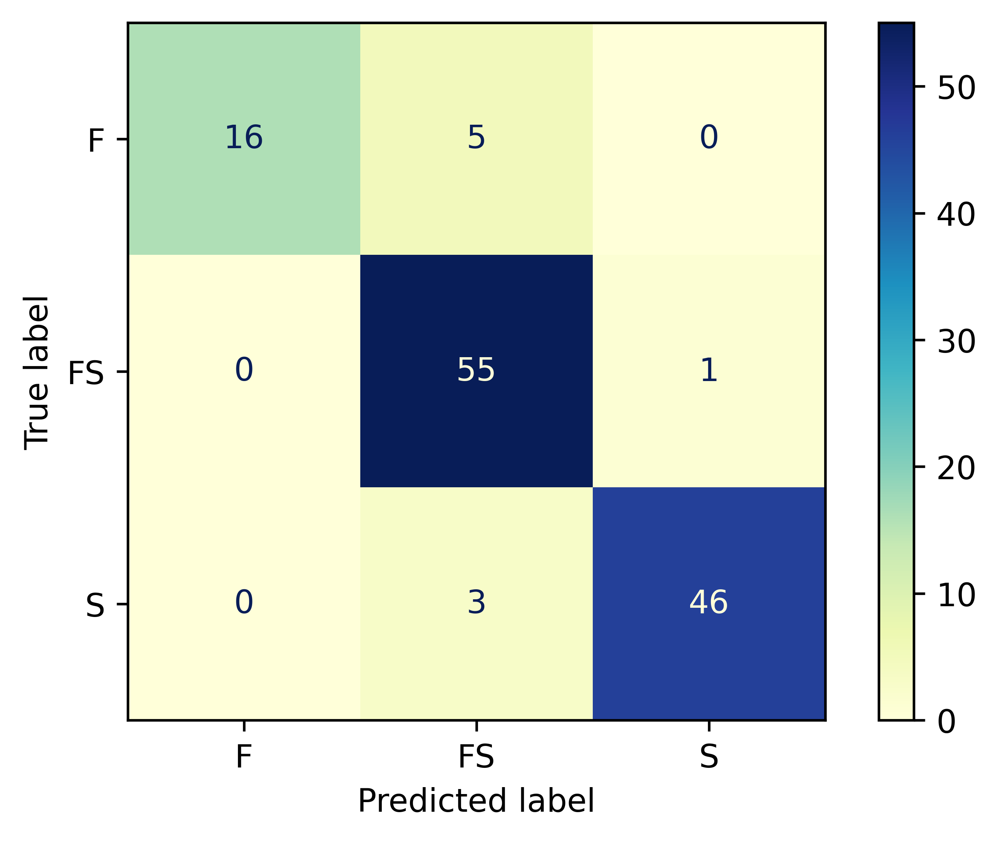

In [27]:
from sklearn.metrics import plot_confusion_matrix
# plt.rcParams['figure.dpi'] =600
plot_confusion_matrix(grid,X_train_pca, y_train_pca, cmap='YlGnBu')  

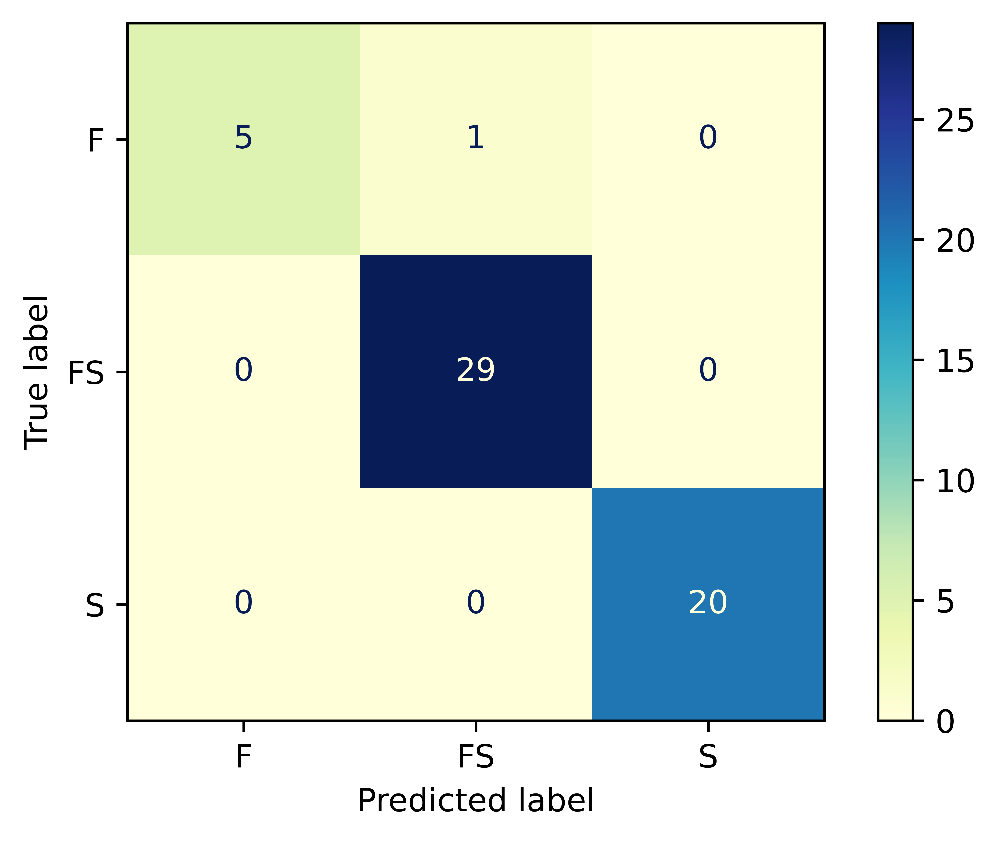

In [25]:
from sklearn.metrics import plot_confusion_matrix
plt.rcParams['figure.dpi'] =1200
plot_confusion_matrix(grid,X_test_pca, y_test_pca, cmap='YlGnBu')  

## random forest optimization 

In [30]:
params2={
#    'learning_rate':np.linspace(0.05,0.25,5), 
    'criterion': ['gini','entropy'],
    'max_features': ['auto', 'sqrt','log2'],
    'max_depth':[x for x in range(1,8,1)], 
    'min_samples_leaf':[x for x in range(1,5,1)], 
    'n_estimators':[x for x in range(50,100,10)]}

In [31]:
clf2 = RandomForestClassifier()
grid2 = GridSearchCV(clf2, params2, cv=10, scoring="accuracy")
grid2.fit(X_pca, y_pca)

GridSearchCV(cv=10, estimator=RandomForestClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [1, 2, 3, 4, 5, 6, 7],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'min_samples_leaf': [1, 2, 3, 4],
                         'n_estimators': [50, 60, 70, 80, 90]},
             scoring='accuracy')

In [32]:
grid2.best_score_   
grid2.best_params_  

{'criterion': 'gini',
 'max_depth': 7,
 'max_features': 'log2',
 'min_samples_leaf': 4,
 'n_estimators': 50}

In [33]:
print('Accuracy classifier on training set: {:.2f}'
     .format(grid2.score(X_train_pca, y_train_pca)))
print('Accuracy classifier on test set: {:.2f}'
     .format(grid2.score(X_test_pca, y_test_pca)))

Accuracy classifier on training set: 0.95
Accuracy classifier on test set: 0.95


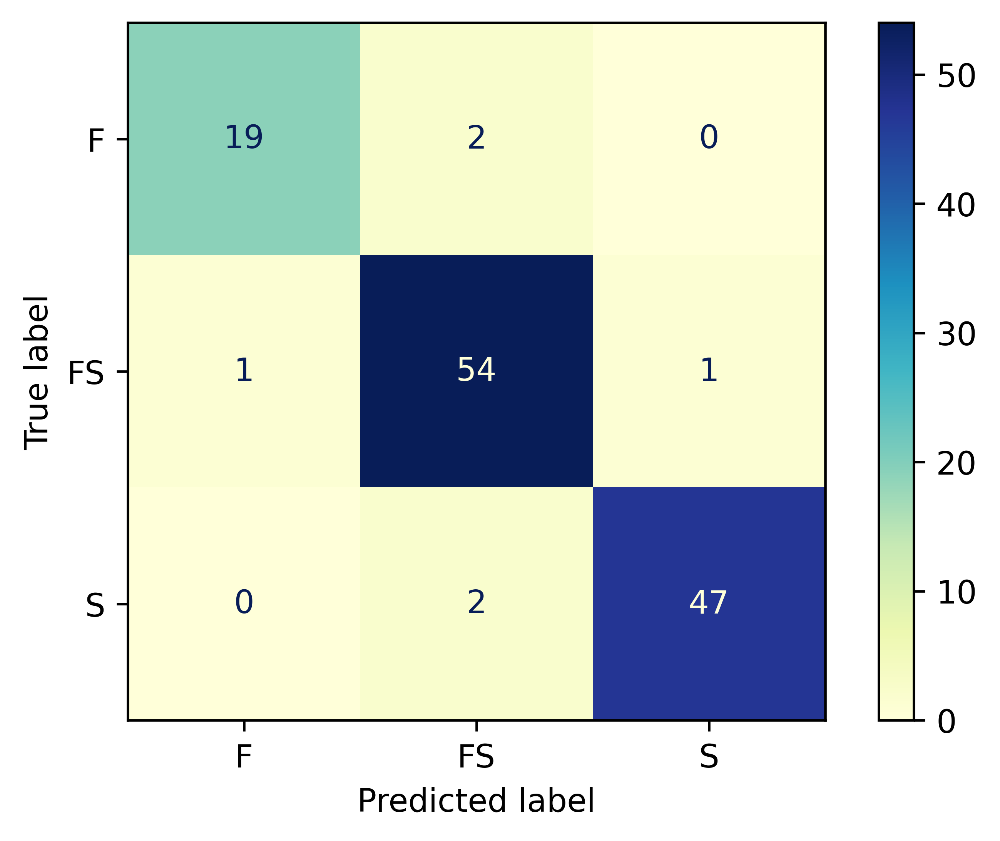

In [34]:
from sklearn.metrics import plot_confusion_matrix
# plt.rcParams['figure.dpi'] =600
plot_confusion_matrix(grid2,X_train_pca, y_train_pca, cmap='YlGnBu')  

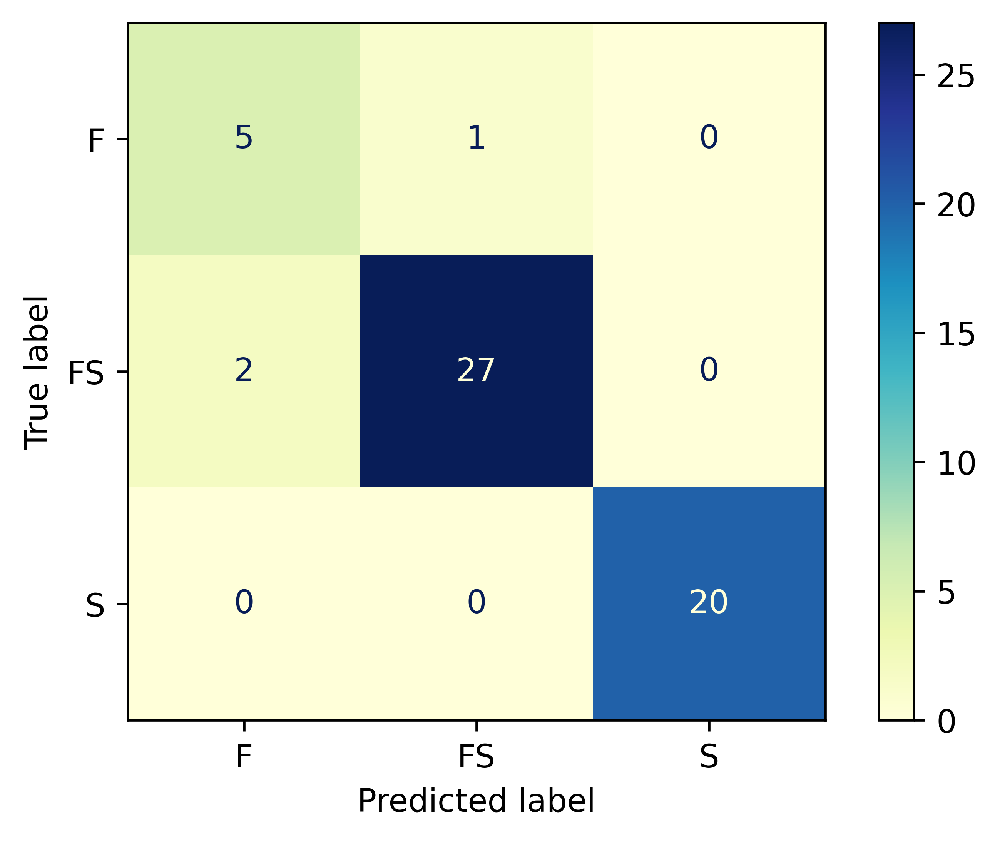

In [35]:
from sklearn.metrics import plot_confusion_matrix
# plt.rcParams['figure.dpi'] =1200
plot_confusion_matrix(grid2,X_test_pca, y_test_pca, cmap='YlGnBu')  

In [11]:
# # 将降维后的数据保存为csv文件（ndarray-->DataFrame结构）
# df_pca=pd.DataFrame(data_pca)
# # df数据小数位数过多，为16位，将df数据全部转换为3位小数
# print("*"*100)
# df_pca=df_pca.round(decimals=3)
# # print(df)
# df_pca.to_csv("pca_data.csv")

# # data_pca.dtype

****************************************************************************************************


In [17]:
# import numpy as np
# from sklearn.preprocessing import scale
# X_scaled = scale(data_pca)
# print (X_scaled)
# print (X_scaled.mean(axis = 0))
# print (X_scaled.std(axis = 0))


[[-0.65986047 -0.53339954 -0.22586425 ...  0.82431924  1.89337891
  -0.99699398]
 [-0.6598465  -0.53421299 -0.22535317 ...  4.23648741  5.52564172
  -1.16898042]
 [-0.5696274  -0.68657202 -0.64348333 ...  0.94516778  0.50130029
   0.66730451]
 ...
 [-0.56945446 -1.81259265  0.38486497 ...  0.87456112 -0.69331611
  -1.36247795]
 [-0.56945449 -1.81259524  0.38487383 ...  1.90788359 -1.07654476
  -0.76952063]
 [ 0.03239434 -1.55472728  0.28969806 ...  3.9214018   0.35960886
  -1.23279166]]
[ 0.00000000e+00  0.00000000e+00 -9.81412618e-18 -1.96282524e-17
 -3.92565047e-17 -2.69888470e-17  0.00000000e+00 -4.41635678e-17
  9.81412618e-18  0.00000000e+00]
[1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [18]:
# df_x=pd.DataFrame(X_scaled)
# print("*"*100)
# df_x=df_x.round(decimals=3)
# # print(df)
# df_x.to_csv("X_scaled.csv")

# # data_pca.dtype

****************************************************************************************************
